# What it is

This notebook read environmental data and create cluster on the environmental data

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
import plotly.express as px
import os

In [2]:
weather_file = '../iwin_weather/IWIN_Weather_AgERA5_20210211.txt'
location_file = '../iwin_weather/IWIN_Locations_AgERA5_20210211.txt'

In [3]:
weather_data = pd.read_csv(weather_file, delimiter=',')
location_data = pd.read_csv(location_file, delimiter=',')

In [4]:
location_data.head()

,LocNo,Lat,Long
0,10001,-26.167,26.167
1,10002,-28.163,28.303
2,10004,-33.830,18.830
3,10006,-33.940,18.864
4,10007,-34.155,19.910


In [5]:
print('weather data shape: ', weather_data.shape)
print('location data shape: ', location_data.shape)

weather data shape:  (11515775, 15)
location data shape:  (770, 3)


In [6]:
weather_data.head()

,location,Year,Month,Day,lat,lon,Precipitation [mm],Relative Humidity max [%],Relative Humidity min [%],Shortwave Radiation [MJ/m2/d],TemperatureMax [C],TemperatureMin [C],Vapor Pressure Deficit max [kPa],Wind Speed 2m [m/s],Wind Speed 10m [m/s]
0,10001,1979,1,1,-26.167,26.167,1.6,63.1,42.3,28.2,29.4,17.3,5.6,3.9,5.2
1,10001,1979,1,2,-26.167,26.167,0.1,62.7,39.1,29.0,30.1,17.5,6.6,3.6,4.9
2,10001,1979,1,3,-26.167,26.167,0.0,50.3,28.5,32.5,27.6,13.5,9.2,3.9,5.2
3,10001,1979,1,4,-26.167,26.167,0.2,76.2,56.4,19.3,21.8,14.4,2.0,3.6,4.9
4,10001,1979,1,5,-26.167,26.167,0.7,61.7,41.4,29.3,26.4,13.6,4.9,2.8,3.8


In [7]:
weather_data.tail()

,location,Year,Month,Day,lat,lon,Precipitation [mm],Relative Humidity max [%],Relative Humidity min [%],Shortwave Radiation [MJ/m2/d],TemperatureMax [C],TemperatureMin [C],Vapor Pressure Deficit max [kPa],Wind Speed 2m [m/s],Wind Speed 10m [m/s]
11515770,68601,2019,12,27,43.933,18.8,2.5,85.5,78.2,4.0,0.9,-4.8,0.2,1.6,2.2
11515771,68601,2019,12,28,43.933,18.8,9.1,84.7,88.5,3.7,-2.1,-5.8,0.1,3.1,4.2
11515772,68601,2019,12,29,43.933,18.8,5.0,92.4,89.6,3.5,-4.7,-7.1,0.0,2.5,3.3
11515773,68601,2019,12,30,43.933,18.8,0.5,89.4,74.3,4.4,-4.2,-12.3,0.2,1.0,1.4
11515774,68601,2019,12,31,43.933,18.8,0.1,88.8,68.2,6.8,3.5,-13.2,0.4,1.3,1.7


In [8]:
print('unique locations: ', len(weather_data.location.unique()))

unique locations:  769


In [9]:
weather_data_groupby = weather_data.groupby(['location', 'Year']).agg({
    'lat': lambda x: x.iloc[0],
    'lon': lambda x: x.iloc[0],
    'Precipitation [mm]': np.mean,
    'Relative Humidity max [%]': np.mean, 
    'Relative Humidity min [%]': np.mean,
    'Shortwave Radiation [MJ/m2/d]': np.mean,
    'TemperatureMax [C]': np.mean,
    'TemperatureMin [C]': np.mean,
    'Vapor Pressure Deficit max [kPa]': np.mean,
    'Wind Speed 2m [m/s]': np.mean,
    'Wind Speed 10m [m/s]': np.mean
})

In [10]:
weather_data_groupby.head(10)

lat     lon  Precipitation [mm]  Relative Humidity max [%]  \
location Year                                                                  
10001    1979 -26.167  26.167            1.905753                  72.235890   
         1980 -26.167  26.167            1.539891                  72.401639   
         1981 -26.167  26.167            1.884384                  75.029041   
         1982 -26.167  26.167            1.802466                  71.735068   
         1983 -26.167  26.167            1.540000                  69.247397   
         1984 -26.167  26.167            1.205738                  67.299454   
         1985 -26.167  26.167            1.895616                  66.747397   
         1986 -26.167  26.167            2.021918                  69.178356   
         1987 -26.167  26.167            1.856438                  69.942192   
         1988 -26.167  26.167            2.482514                  74.484426   

               Relative Humidity min [%]  Shortwave Radiation [MJ/m2/d]  \
location Year                                                             
10001    1979                  39.051233                      20.878630   
         1980                  38.381694                      21.293443   
         1981                  40.550959                      20.729041   
         1982                  38.048219                      21.045753   
         1983                  36.038630                      21.098082   
         1984                  33.888525                      21.307923   
         1985                  35.695616                      20.956986   
         1986                  38.197260                      20.509589   
         1987                  37.367123                      20.728493   
         1988                  40.742077                      19.906011   

               TemperatureMax [C]  TemperatureMin [C]  \
location Year                                           
10001    1979           23.259452           10.769041   
         1980           23.006011            9.966393   
         1981           22.431781            9.620274   
         1982           23.332877           10.523836   
         1983           23.971233           10.930959   
         1984           24.250546           10.842350   
         1985           23.721918           10.796986   
         1986           23.464384           10.750411   
         1987           23.800822           11.032055   
         1988           22.786612           10.288251   

               Vapor Pressure Deficit max [kPa]  Wind Speed 2m [m/s]  \
location Year                                                          
10001    1979                          5.506849             2.507397   
         1980                          5.655738             2.437432   
         1981                          5.292603             2.569315   
         1982                          5.910959             2.532055   
         1983                          6.694795             2.516164   
         1984                          7.763661             2.538798   
         1985                          6.699726             2.464658   
         1986                          5.879726             2.452329   
         1987                          6.031507             2.515068   
         1988                          5.374590             2.492896   

               Wind Speed 10m [m/s]  
location Year                        
10001    1979              3.353425  
         1980              3.259016  
         1981              3.438356  
         1982              3.382192  
         1983              3.367945  
         1984              3.388525  
         1985              3.298630  
         1986              3.275890  
         1987              3.363562  
         1988              3.333880

In [11]:
weather_data_groupby.reset_index(inplace=True)

In [12]:
weather_data_groupby.columns

Index(['location', 'Year', 'lat', 'lon', 'Precipitation [mm]',
       'Relative Humidity max [%]', 'Relative Humidity min [%]',
       'Shortwave Radiation [MJ/m2/d]', 'TemperatureMax [C]',
       'TemperatureMin [C]', 'Vapor Pressure Deficit max [kPa]',
       'Wind Speed 2m [m/s]', 'Wind Speed 10m [m/s]'],
      dtype='object')

In [13]:
wd = weather_data_groupby.drop(['lat', 'lon'], axis = 1)

In [14]:
wd = wd[wd['Year']>1990]

In [15]:
wd = wd.sample(frac=1).reset_index(drop=True)

In [16]:
wd.head()

,location,Year,Precipitation [mm],Relative Humidity max [%],Relative Humidity min [%],Shortwave Radiation [MJ/m2/d],TemperatureMax [C],TemperatureMin [C],Vapor Pressure Deficit max [kPa],Wind Speed 2m [m/s],Wind Speed 10m [m/s]
0,12802,2014,4.580000,87.314247,51.903014,18.550685,26.226027,17.903836,4.196164,1.405205,1.877808
1,25306,2008,2.840710,81.774044,52.999180,15.287158,16.315027,6.958197,2.007923,1.978142,2.648361
2,21231,1995,1.029589,69.492603,35.259452,18.538904,23.986575,12.341096,15.035616,1.870411,2.502192
3,53022,2007,2.810411,65.973151,35.172603,20.837534,22.369863,11.166027,7.522192,0.930685,1.246027
4,65307,2003,1.463562,82.967945,48.645205,16.988493,21.992329,11.235068,5.761644,2.114795,2.826575


In [17]:
wd.loc[:, 'Precipitation [mm]':]

,Precipitation [mm],Relative Humidity max [%],Relative Humidity min [%],Shortwave Radiation [MJ/m2/d],TemperatureMax [C],TemperatureMin [C],Vapor Pressure Deficit max [kPa],Wind Speed 2m [m/s],Wind Speed 10m [m/s]
0,4.580000,87.314247,51.903014,18.550685,26.226027,17.903836,4.196164,1.405205,1.877808
1,2.840710,81.774044,52.999180,15.287158,16.315027,6.958197,2.007923,1.978142,2.648361
2,1.029589,69.492603,35.259452,18.538904,23.986575,12.341096,15.035616,1.870411,2.502192
3,2.810411,65.973151,35.172603,20.837534,22.369863,11.166027,7.522192,0.930685,1.246027
4,1.463562,82.967945,48.645205,16.988493,21.992329,11.235068,5.761644,2.114795,2.826575
...,...,...,...,...,...,...,...,...,...
22296,1.035342,76.327123,40.080000,18.395068,24.838356,12.695068,8.098082,1.972877,2.635342
22297,3.167760,88.134699,45.590164,21.146721,20.521585,9.097814,3.871585,1.777322,2.377869
22298,1.531233,79.414247,30.355616,21.778904,23.287671,9.935616,8.968219,1.934795,2.583014
22299,3.063388,92.667486,65.644809,19.034973,20.743716,12.589344,1.525410,1.018579,1.364754


In [18]:
wd.shape

(22301, 11)

In [19]:
cluster_data = wd.loc[:, 'Precipitation [mm]':]
clustering = AgglomerativeClustering(n_clusters=25).fit(cluster_data)

In [20]:
np.unique(clustering.labels_)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24])

In [21]:
wd['cluster_label'] = clustering.labels_

In [22]:
wd.head()

,location,Year,Precipitation [mm],Relative Humidity max [%],Relative Humidity min [%],Shortwave Radiation [MJ/m2/d],TemperatureMax [C],TemperatureMin [C],Vapor Pressure Deficit max [kPa],Wind Speed 2m [m/s],Wind Speed 10m [m/s],cluster_label
0,12802,2014,4.580000,87.314247,51.903014,18.550685,26.226027,17.903836,4.196164,1.405205,1.877808,3
1,25306,2008,2.840710,81.774044,52.999180,15.287158,16.315027,6.958197,2.007923,1.978142,2.648361,20
2,21231,1995,1.029589,69.492603,35.259452,18.538904,23.986575,12.341096,15.035616,1.870411,2.502192,2
3,53022,2007,2.810411,65.973151,35.172603,20.837534,22.369863,11.166027,7.522192,0.930685,1.246027,0
4,65307,2003,1.463562,82.967945,48.645205,16.988493,21.992329,11.235068,5.761644,2.114795,2.826575,1


In [23]:
wd.shape

(22301, 12)

In [63]:
wd['temp'] = 1

In [64]:
wd_piv = wd.pivot_table(index='location', columns='cluster_label', values = 'temp', aggfunc=np.sum, fill_value=0)

In [65]:
wd_piv.head(50)

cluster_label,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
location,,,,,,,,,,,,,,,,,,,,,
10001,17,0,0,0,0,0,0,0,0,2,...,7,0,0,0,0,0,0,0,0,0
10002,0,0,0,0,0,0,0,0,0,25,...,0,0,0,0,0,4,0,0,0,0
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10007,0,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10008,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10009,1,0,0,0,0,0,0,0,0,22,...,0,0,0,0,0,6,0,0,0,0
10011,0,0,18,0,0,0,0,0,0,9,...,2,0,0,0,0,0,0,0,0,0
10012,0,0,0,0,0,0,0,0,0,23,...,0,0,0,0,0,0,0,0,0,0


In [66]:
wd_piv.shape

(769, 25)

In [67]:
wd_cluster_by_loc = np.argmax(wd_piv.to_numpy(), axis = 1)

In [68]:
wd_piv['cluster'] = wd_cluster_by_loc

In [69]:
wd_piv.to_csv('../processed_data/env_cluster.csv')

In [70]:
wd_piv.head()

cluster_label,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,cluster
location,,,,,,,,,,,,,,,,,,,,,
10001,17,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0
10002,0,0,0,0,0,0,0,0,0,25,...,0,0,0,0,4,0,0,0,0,9
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11
10006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11
10007,0,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11


In [71]:
base_dir = '../wheat_all/done/'
yield_data = pd.DataFrame()
with os.scandir(base_dir) as prime_dir:
    for entry in prime_dir:
        trial_name = entry.name
        yield_file = base_dir + trial_name + '/GrnYld.xls'
        x = pd.read_csv(yield_file, delimiter='\t')
        x['trial'] = trial_name[2:]
        yield_data = yield_data.append(x, ignore_index = True)


In [72]:
yield_data =yield_data[['Loc_no', 'trial']]

In [73]:
embedded = TSNE(n_components=3).fit_transform(wd.loc[:, 'Precipitation [mm]':'Wind Speed 10m [m/s]'])

In [74]:
yield_data = yield_data.drop_duplicates(subset=['Loc_no'])

In [75]:
yield_data.shape

(390, 2)

In [76]:
wd_trial = wd.merge(yield_data, left_on='location', right_on='Loc_no', how='left')

In [77]:
wd_trial.shape

(22301, 15)

In [78]:
size = np.full((embedded.shape[0], ),1)

embedded_df = pd.DataFrame({
    'x': embedded[:, 0],
    'y': embedded[:, 1],
    'z': embedded[:, 2],
    'cluster_label': wd['cluster_label'].to_numpy(dtype='str'),
    'size': size,
    'trial': wd_trial['trial'].to_numpy(dtype='str')
})

In [79]:
embedded_df.dropna(inplace=True)
embedded_df = embedded_df[embedded_df['trial'] != 'nan']
# embedded_df[embedded_df['trial'] == 'YCYT']['trial'] = 'WYCYT'
embedded_df['trial'] = embedded_df['trial'].replace(['YCYT'], 'WYCYT')

In [80]:
fig = px.scatter_3d(embedded_df, x='x', y='y', z='z',
              color='cluster_label', symbol='cluster_label',
                   size_max=3)
fig.show()
fig.write_html("../figures/cluster_label.html")

In [81]:
fig = px.scatter_3d(embedded_df, x='x', y='y', z='z',
              color='trial', symbol='trial',
                   size_max=1000)
fig.show()
fig.write_html("../figures/trial_cluster.html")

In [285]:
embedded_df

,x,y,z,cluster_label,size,trial
0,12.008481,19.181780,-16.157608,2,1,HRWYT
1,-15.435818,-12.584229,-7.006237,1,1,nan
2,-18.822632,3.295363,13.540198,17,1,nan
3,-22.150597,-15.162891,3.840121,7,1,HRWYT
4,5.917140,20.706318,2.911918,16,1,nan
...,...,...,...,...,...,...
22296,14.957439,-6.833075,-0.829593,9,1,nan
22297,-3.528946,-7.908999,2.337042,1,1,nan
22298,1.459282,-11.714351,3.571069,1,1,nan
22299,7.569539,-0.833577,-19.684027,9,1,nan


In [286]:
import matplotlib.pyplot as plt
cmap=plt.get_cmap('tab10')

In [287]:
cmap.colors[0]

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765)

<ipython-input-288-2e2348ea4bd2>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [289]:
embedded_df[embedded_df['trial']== "YCYT"].head()

,x,y,z,cluster_label,size,trial


In [290]:
markers = [".", "v", '^', "1", "s", "p", "+", "x", "D", "3", "<", '>' ]

In [298]:
len(partial_embed)

986

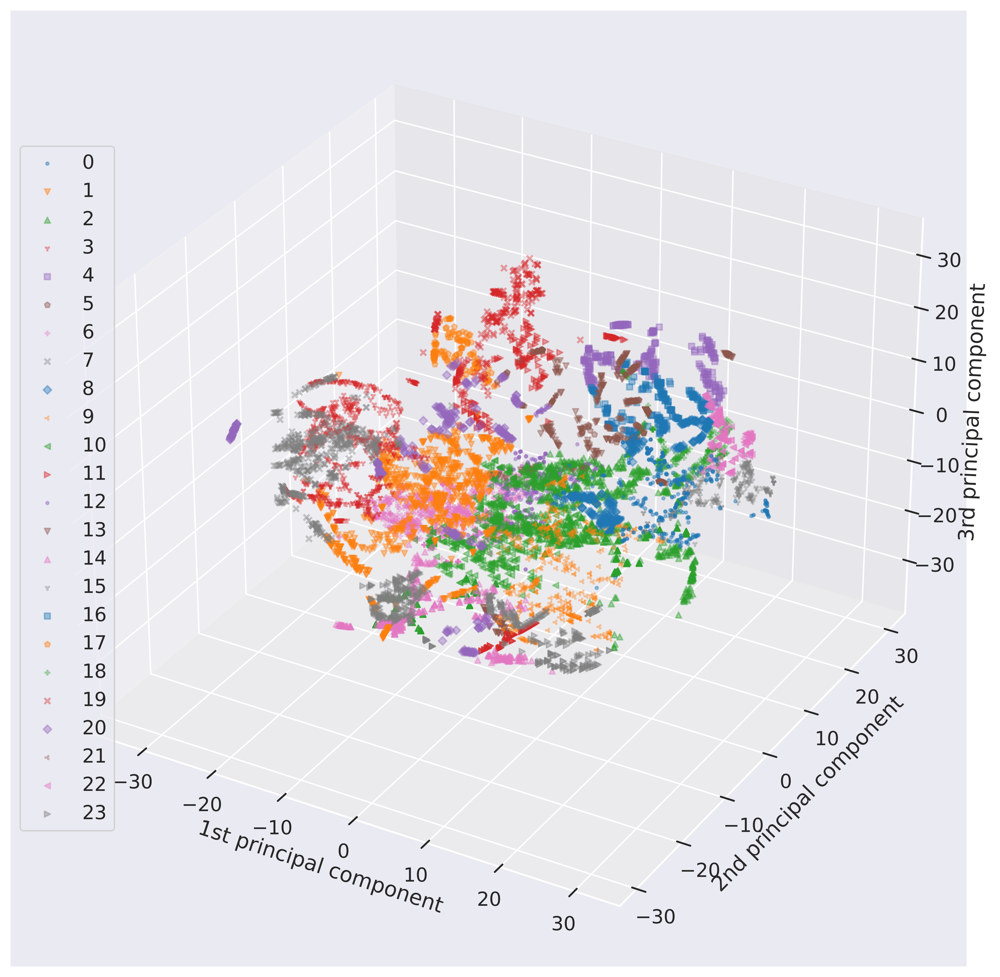

In [291]:
fig = plt.figure(figsize=(16,12), dpi=720)
ax = fig.add_subplot(projection='3d')
unique_clusters = np.arange(0, 24)

for i in unique_clusters:
    partial_embed = embedded_df[embedded_df['cluster_label'] == str(i)]
    
    ax.scatter(partial_embed['x'].to_numpy(), 
               partial_embed['y'].to_numpy(), 
               partial_embed['z'].to_numpy() , 
               marker=markers[i%12], 
               color=cmap.colors[i%8], 
               s=16, 
               alpha=0.4,
               label=i)
ax.legend( loc='center left')
    
ax.set_xlabel('1st principal component')
ax.set_ylabel('2nd principal component')
ax.set_zlabel('3rd principal component')

plt.show()

fig.savefig('../figures/weather_cluster.jpeg', dpi=720)

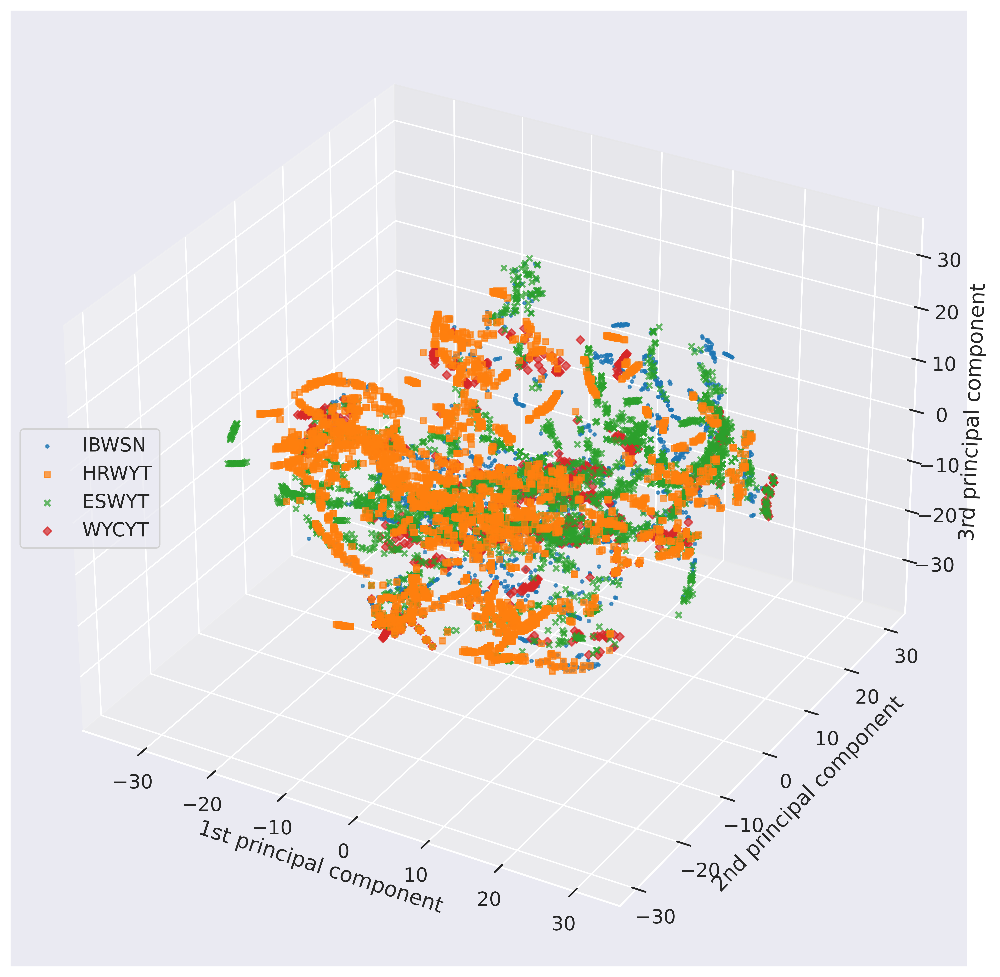

In [292]:


markers = [".","s", "x", "D"]


fig = plt.figure(figsize=(16,12), dpi=720)
ax = fig.add_subplot(projection='3d')
unique_trials = ['IBWSN', 'HRWYT', 'ESWYT', 'WYCYT']

for i, trial in enumerate(unique_trials):
    partial_embed = embedded_df[embedded_df['trial'] == trial]
    
    ax.scatter(partial_embed['x'].to_numpy(), 
               partial_embed['y'].to_numpy(), 
               partial_embed['z'].to_numpy() , 
               marker=markers[i%4], 
               color=cmap.colors[i%8], 
               s=16, 
               alpha=0.7,
               label=trial)
ax.legend( loc='center left')
    
ax.set_xlabel('1st principal component')
ax.set_ylabel('2nd principal component')
ax.set_zlabel('3rd principal component')

plt.show()

fig.savefig('../figures/weather_cluster_by_trial.jpeg', dpi=720)

In [293]:
embedded_df

,x,y,z,cluster_label,size,trial
0,12.008481,19.181780,-16.157608,2,1,HRWYT
3,-22.150597,-15.162891,3.840121,7,1,HRWYT
7,19.012156,0.042867,-3.263995,0,1,ESWYT
9,-33.962517,-8.253681,0.639713,20,1,ESWYT
11,-27.298292,0.625189,6.071815,3,1,HRWYT
...,...,...,...,...,...,...
22286,13.594989,-10.645011,-2.793160,9,1,IBWSN
22291,14.092865,17.627354,-20.067991,2,1,HRWYT
22292,6.817912,12.299227,1.582093,16,1,ESWYT
22294,-17.832560,-2.557153,-9.278414,3,1,ESWYT


In [295]:
cluster_by_trial = embedded_df.groupby(['cluster_label', 'trial']).agg({
    
    'size': lambda x: np.sum(x)
})

In [296]:
cluster_by_trial.reset_index(inplace=True)
cluster_by_trial['cluster_label'] = cluster_by_trial['cluster_label'].astype('int')
cluster_by_trial.head()

,cluster_label,trial,size
0,0,ESWYT,197
1,0,HRWYT,107
2,0,IBWSN,120
3,0,WYCYT,93
4,1,ESWYT,140


<Figure size 16384x8192 with 0 Axes>

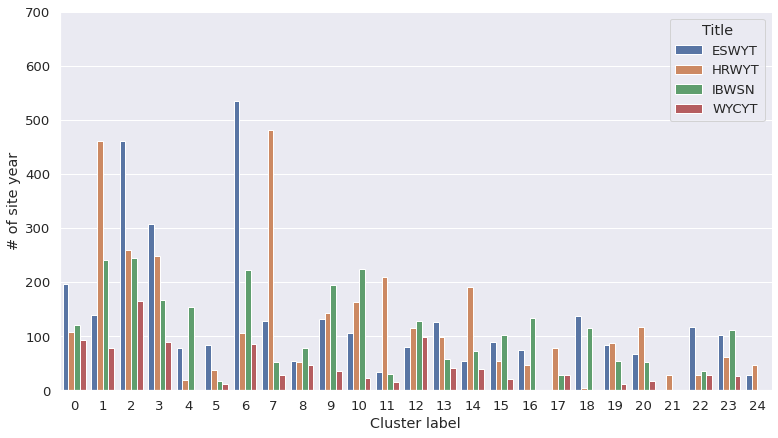

In [297]:
import seaborn as sns

plt.figure(figsize=(16,8), dpi=1024)
sns.set(font_scale=1.2)
p = sns.catplot(x="cluster_label", 
            y="size", 
            hue="trial", 
            kind="bar", 
            data=cluster_by_trial,
           height=6,
           aspect=1.8,
           ci=None,
           legend_out=False)

p._legend.set_title('Trial')
p.set_axis_labels('Cluster label', '# of site year')
plt.legend(loc='upper right', title='Title')
p.set(ylim=(0, 700))
plt.savefig('../figures/trial_count_by_cluster.jpeg')